In [116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import norm

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
import json

other_trader_path = './training/other_traders_info/'
other_trader_names = ['Valentina', 'Vinnie', 'Vladimir', 'Vivian', 'Celeste', 'Colin', 'Carlos', 'Camilla', 'Pablo', 'Penelope', 
                          'Percy', 'Petunia', 'Ruby', 'Remy', 'Rhianna', 'Raj', 'Amelia', 'Adam', 'Alina', 'Amir']
    

In [117]:
def calculate_vwap(dataframe):
    """
    Calculate an approximate VWAP using multiple levels of order book data.
    
    Parameters:
    - dataframe: A pandas DataFrame with columns for multiple bid and ask prices and volumes.
    
    Returns:
    - vwap: The calculated VWAP as a float.
    """
    # Initialize variables to store the sum of price*volume products and the sum of volumes
    total_price_volume = 0
    total_volume = 0
    dataframe.fillna(0, inplace = True)
    
    # Iterate through the bid and ask levels
    for i in range(1, 4):  # Assuming 3 levels as per your DataFrame structure
        bid_price_col = f'bid_price_{i}'
        bid_volume_col = f'bid_volume_{i}'
        ask_price_col = f'ask_price_{i}'
        ask_volume_col = f'ask_volume_{i}'
        
        # Calculate the product of price and volume for both bid and ask, and add to total
        total_price_volume += (dataframe[bid_price_col] * dataframe[bid_volume_col])
        total_price_volume += (dataframe[ask_price_col] * dataframe[ask_volume_col])
        
        # Sum up the volumes for both bid and ask
        total_volume += dataframe[bid_volume_col]
        total_volume += dataframe[ask_volume_col]
    
    # Calculate and return the VWAP
    vwap = total_price_volume / total_volume
    return vwap


def calculate_imbalance(dataframe):
    flag = 0
    dataframe.fillna(0, inplace = True)
    bid_volume, ask_volume = 0, 0
    
    # Iterate through the bid and ask levels
    for i in range(1, 4):  # Assuming 3 levels as per your DataFrame structure
        bid_volume_col = f'bid_volume_{i}'
        ask_volume_col = f'ask_volume_{i}'
        
        # Calculate the product of price and volume for both bid and ask, and add to total
        
        # Sum up the volumes for both bid and ask
        bid_volume += dataframe[bid_volume_col]
        ask_volume += dataframe[ask_volume_col]
    
    if bid_volume > ask_volume:
        flag = 1
    elif bid_volume < ask_volume:
        flag = -1
    # Calculate and return the VWAP
    return abs(bid_volume - ask_volume), flag


def calculate_mean_best(dataframe):
    dataframe.fillna(0, inplace = True)

    best_bid, best_ask = float('inf'),  float('-inf')

    for i in range(1, 4):  # Assuming 3 levels as per your DataFrame structure
        bid_price_col = f'bid_price_{i}'
        ask_price_col = f'ask_price_{i}'
        bid = dataframe[bid_price_col] if dataframe[bid_price_col] else float('inf')
        ask = dataframe[ask_price_col] if dataframe[ask_price_col] else float('-inf')
        best_bid = min(best_bid, bid)
        best_ask = max(best_ask, ask)
    return (best_bid + best_ask) / 2


def reformat_json_data_dict(snake_data_dicts: list[dict[int, dict[str, dict[str, float]]]])-> dict[str, dict[str, list]]:
    res: dict[str, dict[str, list]] = {}
    idx_offset = 0
    for snake_data_dict in snake_data_dicts:
        for timestamp, data_dict in snake_data_dict.items():
            for trader_name, value_dict in data_dict.items():
                if trader_name not in res:
                    res[trader_name] = {}
                for product, value in value_dict.items():
                    if product not in res[trader_name]:
                        res[trader_name][product] = []
                    res[trader_name][product].append(value)
    return res

## Round 1

In [5]:
round = 1

In [101]:
df_1 = pd.read_csv(f'training/prices_round_{round}_day_-2.csv' , sep = ';')
df_2 = pd.read_csv(f'training/prices_round_{round}_day_-1.csv', sep = ';')
df_3 = pd.read_csv(f'training/prices_round_{round}_day_0.csv', sep = ';')
# df_4 = pd.read_csv('training/prices_round_1_day_1.csv', sep = ';')
df_1['global_timestamp'] = df_1.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
df_2['global_timestamp'] = df_2.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
df_3['global_timestamp'] = df_3.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
# df_4['global_timestamp'] = df_4.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
df = pd.concat([df_1, df_2, df_3,])
df = df.drop(['profit_and_loss'], axis = 1)
df_amethyst = df[df['product'] == 'AMETHYSTS'].reset_index(drop=True)
df_starfruit = df[df['product'] == 'STARFRUIT'].reset_index(drop=True)

In [59]:
filename = other_trader_path + f"round_{round}_day_-2_profit_balance_snakes.json"
with open(filename, 'r') as file:
    profit_balance_snakes_1 = json.load(file)
file.close()
filename = other_trader_path + f"round_{round}_day_-1_profit_balance_snakes.json"
with open(filename, 'r') as file:
    profit_balance_snakes_2 = json.load(file)
filename = other_trader_path + f"round_{round}_day_0_profit_balance_snakes.json"
with open(filename, 'r') as file:
    profit_balance_snakes_3 = json.load(file)
file.close()

In [60]:
profit_balance_snakes_data_dicts = [profit_balance_snakes_1, profit_balance_snakes_2, profit_balance_snakes_3]
profit_balance_snakes = reformat_json_data_dict(profit_balance_snakes_data_dicts)

In [106]:
df['vwap'] = df.apply(calculate_vwap, axis = 1)
df_amethyst['vwap'] = df_amethyst.apply(calculate_vwap, axis = 1)
df_starfruit['vwap'] = df_starfruit.apply(calculate_vwap, axis = 1)

df['best_mean'] = df.apply(calculate_mean_best, axis = 1)
df_amethyst['best_mean'] = df_amethyst.apply(calculate_mean_best, axis = 1)
df_starfruit['best_mean'] = df_starfruit.apply(calculate_mean_best, axis = 1)

### Amethyst

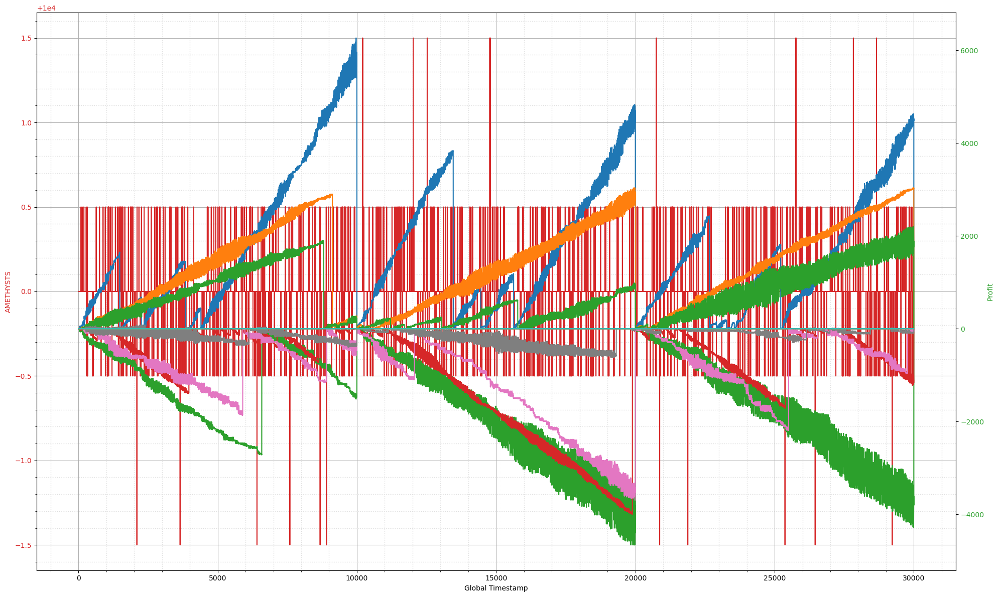

In [43]:
# Create initial subplot and first y-axis
fig, ax1 = plt.subplots(figsize=(20, 12))

color = 'tab:red'
ax1.set_xlabel('Global Timestamp')
ax1.set_ylabel('AMETHYSTS', color=color)
ax1.plot(df_amethyst['best_mean'], color=color)
ax1.tick_params(axis='y', labelcolor=color)
# ax1.axvline(x=1e4, color='r', linestyle='-', linewidth=1)
# ax1.axvline(x=2e4, color='r', linestyle='-', linewidth=1)


ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Profit', color=color)
for trader_name in profit_balance_snakes:
    ax2.plot(profit_balance_snakes[trader_name]['AMETHYSTS'], label = trader_name)
ax2.tick_params(axis='y', labelcolor=color)

# Major ticks every 20, minor ticks every 5
major_ticks = np.arange(0, 3e4, 1e3)
minor_ticks = np.arange(0, 3e4, 5e3)

ax1.grid(True, which = 'major')
ax1.grid(True, which = 'minor', color='#DDDDDD', linestyle=':', linewidth=1)
ax1.minorticks_on()

fig.tight_layout()
plt.show()


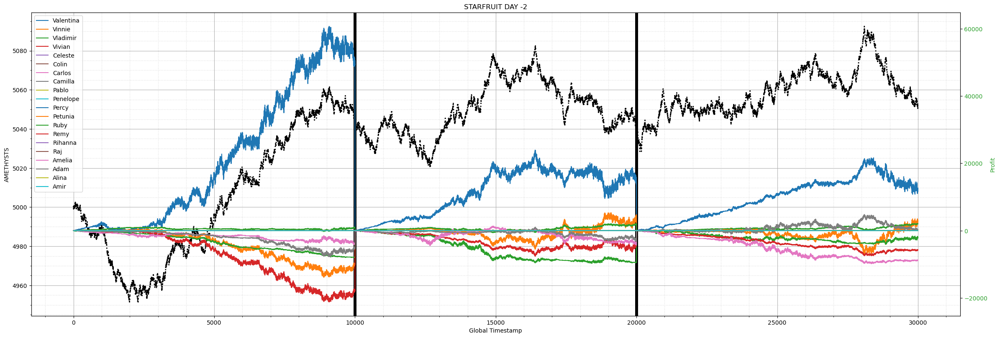

In [94]:
fig, ax1 = plt.subplots(figsize=(24, 8))

color = 'k'
ax1.set_xlabel('Global Timestamp')
ax1.set_ylabel('STARTFRUIT', color=color)
ax1.plot(df_starfruit.loc[:,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
ax1.tick_params(axis='y', labelcolor=color)
ax1.axvline(x=1e4, color='k', linestyle='-', linewidth=5)
ax1.axvline(x=2e4, color='k', linestyle='-', linewidth=5)

ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Profit', color=color)
for trader_name in profit_balance_snakes:
    ax2.plot(profit_balance_snakes[trader_name]['STARFRUIT'], label = trader_name)
ax2.tick_params(axis='y', labelcolor=color)

# Major ticks every 20, minor ticks every 5
major_ticks = np.arange(0, 1e4, 1e2)
minor_ticks = np.arange(0, 1e4, 5e2)

ax1.grid(True, which = 'major')
ax1.grid(True, which = 'minor', color='#DDDDDD', linestyle=':', linewidth=1)
ax1.minorticks_on()
ax2.legend()

fig.tight_layout()
plt.title('STARFRUIT DAY -2')
plt.show()


### Starfruit

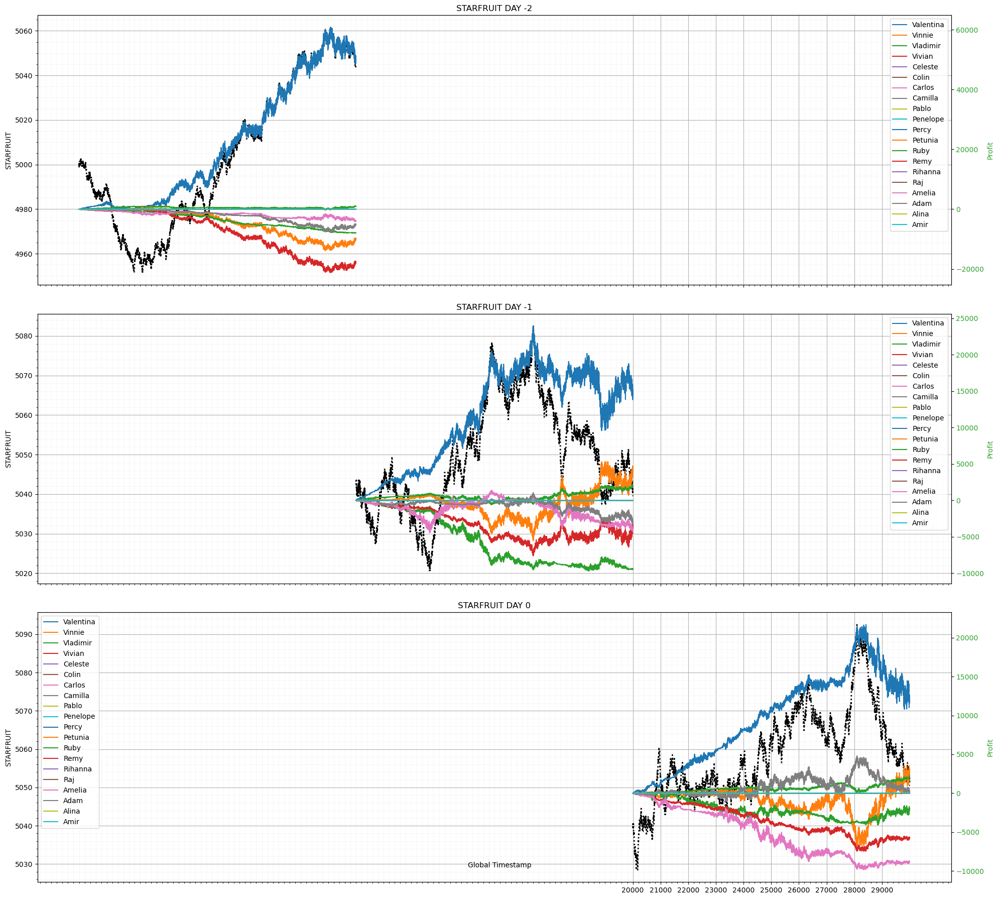

In [112]:
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['STARFRUIT DAY -2', 'STARFRUIT DAY -1', 'STARFRUIT DAY 0']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('STARFRUIT', color=color)
    ax1.plot(range(start, end), df_starfruit.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Profit', color=color)
    for trader_name in profit_balance_snakes:
        ax2.plot(range(start, end),profit_balance_snakes[trader_name]['STARFRUIT'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

In [110]:
filename = other_trader_path + f"round_{round}_day_-2_snake_positions_by_timestamp.json"
with open(filename, 'r') as file:
    snake_positions_by_timestamp_1 = json.load(file)
file.close()
filename = other_trader_path + f"round_{round}_day_-1_snake_positions_by_timestamp.json"
with open(filename, 'r') as file:
    snake_positions_by_timestamp_2 = json.load(file)
filename = other_trader_path + f"round_{round}_day_0_snake_positions_by_timestamp.json"
with open(filename, 'r') as file:
    snake_positions_by_timestamp_3 = json.load(file)
file.close()

snake_positions_dicts = [snake_positions_by_timestamp_1, snake_positions_by_timestamp_2, snake_positions_by_timestamp_3]
snake_positions = reformat_json_data_dict(snake_positions_dicts)

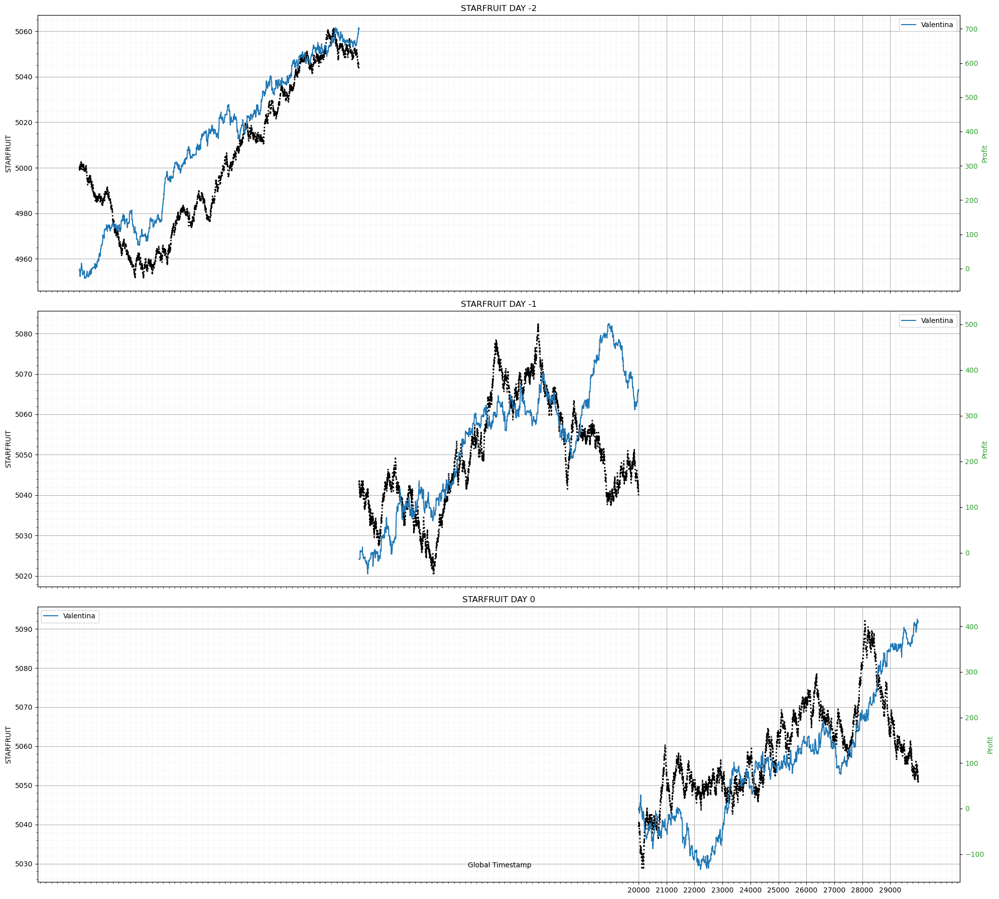

In [113]:
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['STARFRUIT DAY -2', 'STARFRUIT DAY -1', 'STARFRUIT DAY 0']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('STARFRUIT', color=color)
    ax1.plot(range(start, end), df_starfruit.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Profit', color=color)
    ax2.plot(range(start, end),snake_positions['Valentina']['STARFRUIT'][start:end], label = 'Valentina')
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

### Basket

In [118]:
df_1 = pd.read_csv('training/prices_round_3_day_0.csv' , sep = ';')
df_2 = pd.read_csv('training/prices_round_3_day_1.csv', sep = ';')
df_3 = pd.read_csv('training/prices_round_3_day_2.csv', sep = ';')
df_1['global_timestamp'] = df_1.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
df_2['global_timestamp'] = df_2.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
df_3['global_timestamp'] = df_3.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
df = pd.concat([df_1, df_2, df_3])
df = df.drop(['profit_and_loss'], axis = 1)

In [119]:
df_gift_basket = df[df['product'] == 'GIFT_BASKET'].reset_index(drop=True)
df_chocolate = df[df['product'] == 'CHOCOLATE'].reset_index(drop=True)
df_strawberries = df[df['product'] == 'STRAWBERRIES'].reset_index(drop=True)
df_roses = df[df['product'] == 'ROSES'].reset_index(drop=True)

In [120]:
print(f"GIFT_BASKET, {df_gift_basket['mid_price'].mean()}")
print(f"CHOCOLATE, {df_chocolate['mid_price'].mean()}")
print(f"STRAWBERRIES, {df_strawberries['mid_price'].mean()}")
print(f"ROSES, {df_roses['mid_price'].mean()}")
# 4 `CHOCOLATE` bars + 6 `STRAWBERRIES` + 1 `ROSES`
print(f"combined_basket, {4 * df_chocolate['mid_price'].mean() + 6 * df_strawberries['mid_price'].mean() + df_roses['mid_price'].mean()}")

GIFT_BASKET, 70708.80063333333
CHOCOLATE, 7915.34725
STRAWBERRIES, 4026.83735
ROSES, 14506.89705
combined_basket, 70329.31015


In [121]:
df_gift_basket['best_mean'] = df_gift_basket.apply(calculate_mean_best, axis = 1)
df_chocolate['best_mean'] = df_chocolate.apply(calculate_mean_best, axis = 1)
df_strawberries['best_mean'] = df_strawberries.apply(calculate_mean_best, axis = 1)
df_roses['best_mean'] = df_roses.apply(calculate_mean_best, axis = 1)

In [122]:
print(f"GIFT_BASKET, {df_gift_basket['best_mean'].mean()}")
print(f"CHOCOLATE, {df_chocolate['best_mean'].mean()}")
print(f"STRAWBERRIES, {df_strawberries['best_mean'].mean()}")
print(f"ROSES, {df_roses['best_mean'].mean()}")
# 4 `CHOCOLATE` bars + 6 `STRAWBERRIES` + 1 `ROSES`
print(f"combined_basket, {4 * df_chocolate['best_mean'].mean() + 6 * df_strawberries['best_mean'].mean() + df_roses['best_mean'].mean()}")

GIFT_BASKET, 70708.7918
CHOCOLATE, 7915.346866666667
STRAWBERRIES, 4026.839
ROSES, 14506.895916666666
combined_basket, 70329.31738333333


In [123]:
combined_basket_best_mean = 4 * df_chocolate['best_mean'] + 6 * df_strawberries['best_mean'] + df_roses['best_mean'] + 379.5
combined_basket_mid = 4 * df_chocolate['mid_price'] + 6 * df_strawberries['mid_price'] + df_roses['mid_price'] + 379.5

In [124]:
round = 3
filename = other_trader_path + f"round_{round}_day_0_profit_balance_snakes.json"
with open(filename, 'r') as file:
    profit_balance_snakes_1 = json.load(file)
file.close()
filename = other_trader_path + f"round_{round}_day_1_profit_balance_snakes.json"
with open(filename, 'r') as file:
    profit_balance_snakes_2 = json.load(file)
filename = other_trader_path + f"round_{round}_day_2_profit_balance_snakes.json"
with open(filename, 'r') as file:
    profit_balance_snakes_3 = json.load(file)
file.close()

In [125]:
profit_balance_snakes_data_dicts = [profit_balance_snakes_1, profit_balance_snakes_2, profit_balance_snakes_3]
profit_balance_snakes = reformat_json_data_dict(profit_balance_snakes_data_dicts)

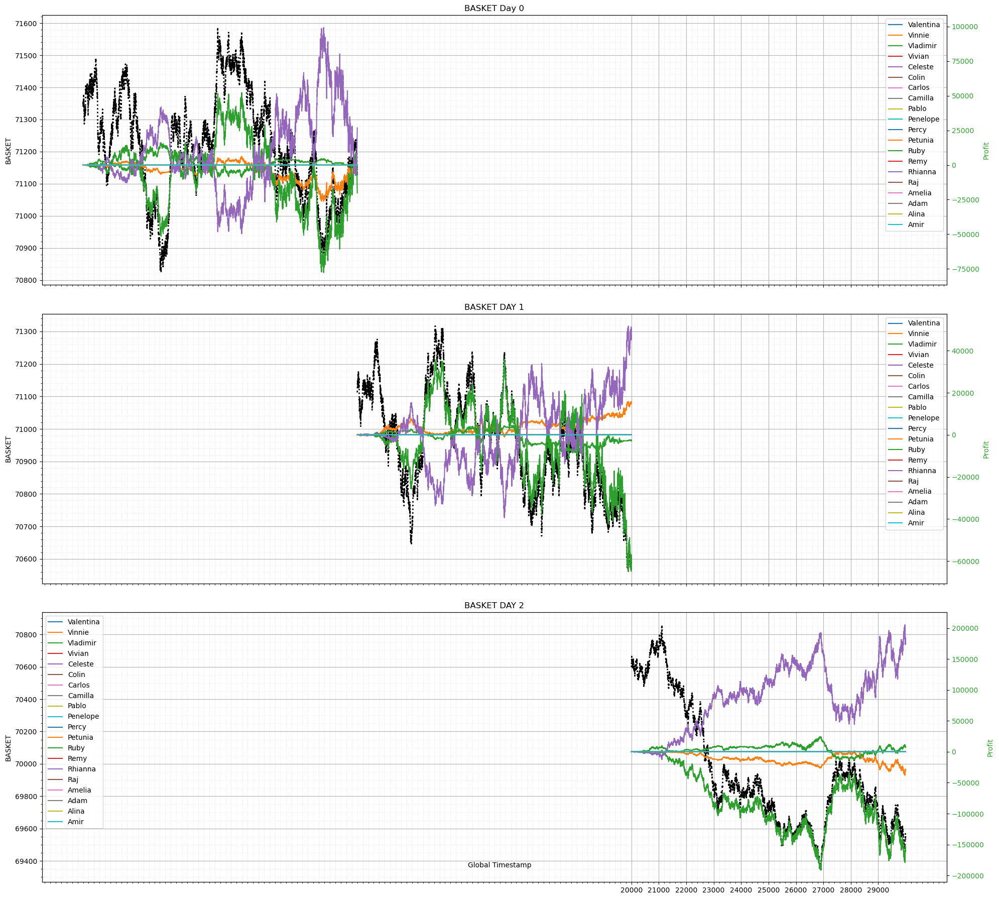

In [126]:
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['BASKET Day 0', 'BASKET DAY 1', 'BASKET DAY 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('BASKET', color=color)
    ax1.plot(range(start, end), df_gift_basket.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Profit', color=color)
    for trader_name in profit_balance_snakes:
        ax2.plot(range(start, end),profit_balance_snakes[trader_name]['GIFT_BASKET'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

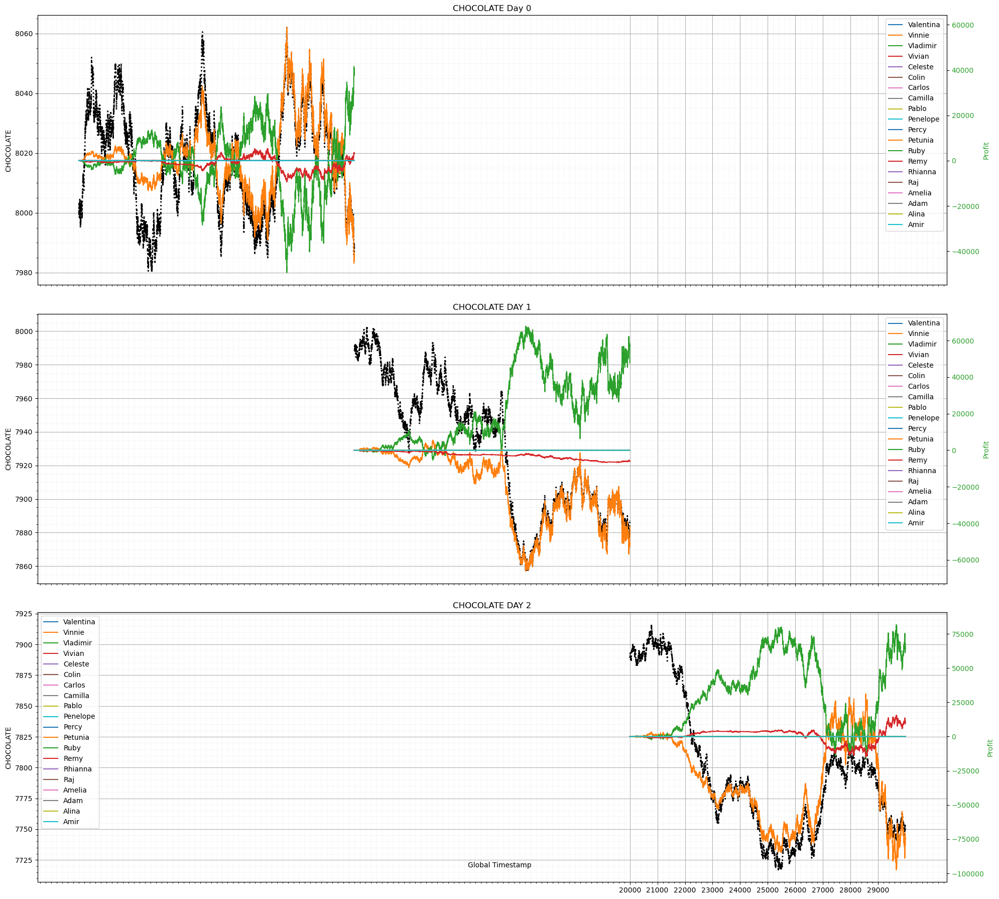

In [127]:
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['CHOCOLATE Day 0', 'CHOCOLATE DAY 1', 'CHOCOLATE DAY 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('CHOCOLATE', color=color)
    ax1.plot(range(start, end), df_chocolate.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Profit', color=color)
    for trader_name in profit_balance_snakes:
        ax2.plot(range(start, end),profit_balance_snakes[trader_name]['CHOCOLATE'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

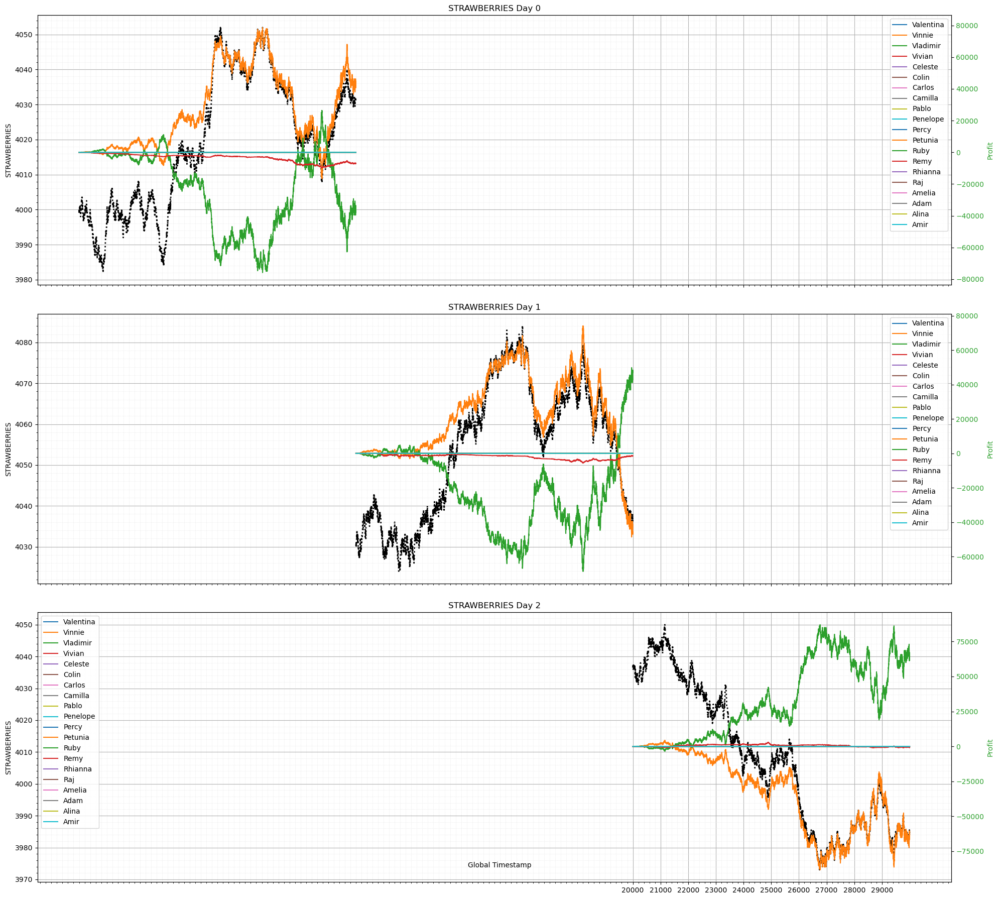

In [128]:
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['STRAWBERRIES Day 0', 'STRAWBERRIES Day 1', 'STRAWBERRIES Day 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('STRAWBERRIES', color=color)
    ax1.plot(range(start, end), df_strawberries.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Profit', color=color)
    for trader_name in profit_balance_snakes:
        ax2.plot(range(start, end),profit_balance_snakes[trader_name]['STRAWBERRIES'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

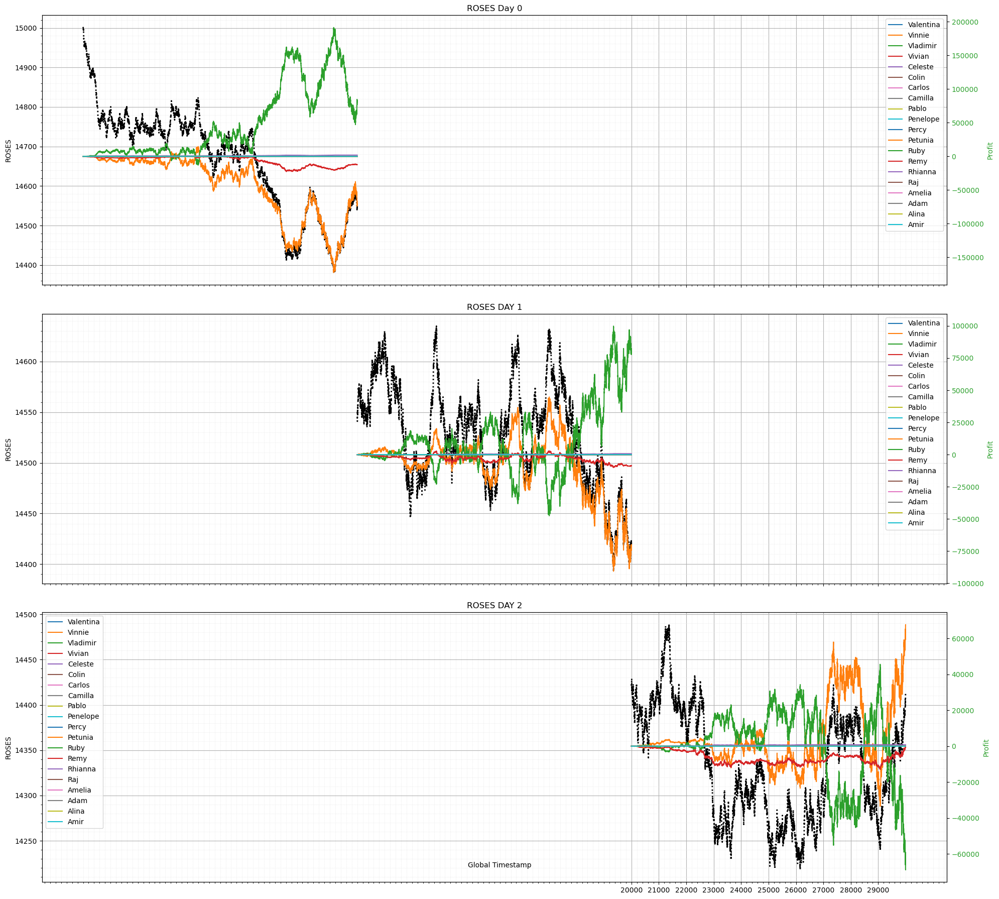

In [129]:
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis


titles = ['ROSES Day 0', 'ROSES DAY 1', 'ROSES DAY 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('ROSES', color=color)
    ax1.plot(range(start, end), df_roses.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Profit', color=color)
    for trader_name in profit_balance_snakes:
        ax2.plot(range(start, end),profit_balance_snakes[trader_name]['ROSES'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

In [130]:
round = 3
filename = other_trader_path + f"round_{round}_day_0_snake_positions_by_timestamp.json"
with open(filename, 'r') as file:
    snake_positions_by_timestamp_1 = json.load(file)
file.close()
filename = other_trader_path + f"round_{round}_day_1_snake_positions_by_timestamp.json"
with open(filename, 'r') as file:
    snake_positions_by_timestamp_2 = json.load(file)
filename = other_trader_path + f"round_{round}_day_2_snake_positions_by_timestamp.json"
with open(filename, 'r') as file:
    snake_positions_by_timestamp_3 = json.load(file)
file.close()

snake_positions_dicts = [snake_positions_by_timestamp_1, snake_positions_by_timestamp_2, snake_positions_by_timestamp_3]
snake_positions = reformat_json_data_dict(snake_positions_dicts)

In [131]:
potential_traders = ['Vladimir', 'Vinnie', 'Ruby', 'Rhianna']
for trader_name in potential_traders:
        print('GIFT_BASKET', trader_name)
        print(np.corrcoef(df_gift_basket.loc[0:9999, 'best_mean'], snake_positions[trader_name]['GIFT_BASKET'][0:10000])[0][1],
              np.corrcoef(df_gift_basket.loc[10000:19999, 'best_mean'], snake_positions[trader_name]['GIFT_BASKET'][10000:20000])[0][1],
              np.corrcoef(df_gift_basket.loc[20000:29999, 'best_mean'], snake_positions[trader_name]['GIFT_BASKET'][20000:30000])[0][1])


for trader_name in potential_traders:
        print('CHOCOLATE', trader_name)
        print(np.corrcoef(df_chocolate.loc[0:9999, 'best_mean'], snake_positions[trader_name]['CHOCOLATE'][0:10000])[0][1]
                ,np.corrcoef(df_chocolate.loc[10000:19999, 'best_mean'], snake_positions[trader_name]['CHOCOLATE'][10000:20000])[0][1]
                ,np.corrcoef(df_chocolate.loc[20000:29999, 'best_mean'], snake_positions[trader_name]['CHOCOLATE'][20000:30000])[0][1])

for trader_name in potential_traders:
        print('STRAWBERRIES', trader_name)
        print(np.corrcoef(df_strawberries.loc[0:9999, 'best_mean'], snake_positions[trader_name]['STRAWBERRIES'][0:10000])[0][1]
                ,np.corrcoef(df_strawberries.loc[10000:19999, 'best_mean'], snake_positions[trader_name]['STRAWBERRIES'][10000:20000])[0][1]
                ,np.corrcoef(df_strawberries.loc[20000:29999, 'best_mean'], snake_positions[trader_name]['STRAWBERRIES'][20000:30000])[0][1])


for trader_name in potential_traders:
        print('ROSES', trader_name)
        print(np.corrcoef(df_roses.loc[0:9999, 'best_mean'], snake_positions[trader_name]['ROSES'][0:10000])[0][1]
                ,np.corrcoef(df_roses.loc[10000:19999, 'best_mean'], snake_positions[trader_name]['ROSES'][10000:20000])[0][1]
                ,np.corrcoef(df_roses.loc[20000:29999, 'best_mean'], snake_positions[trader_name]['ROSES'][20000:30000])[0][1])

GIFT_BASKET Vladimir
-0.31323635082418205 -0.5634291901549775 -0.8529855011764543
GIFT_BASKET Vinnie
-0.38614458286469194 0.5822940975733993 -0.6977827928718157
GIFT_BASKET Ruby
-0.17105417553127322 0.21330812046201977 0.8561309032712147
GIFT_BASKET Rhianna
0.3621808221966053 0.48505659003019813 0.7882054771820407
CHOCOLATE Vladimir
0.01936838195073077 0.8356701863675091 0.6436153693634784
CHOCOLATE Vinnie
-0.039150215002569835 -0.8553074018544785 -0.5535077885785685
CHOCOLATE Ruby
nan nan nan
CHOCOLATE Rhianna
nan nan nan
STRAWBERRIES Vladimir
-0.7051443306286391 -0.6223339029954519 0.9264664296996781
STRAWBERRIES Vinnie
0.7185439964773647 0.6126502148357371 -0.9261946820728991
STRAWBERRIES Ruby
nan nan nan
STRAWBERRIES Rhianna
nan nan nan
ROSES Vladimir
0.880968233532176 0.49382708042979945 0.36061257483057324
ROSES Vinnie
-0.8572730068829935 -0.4958973752256561 -0.33123450041616925
ROSES Ruby
nan nan nan
ROSES Rhianna
-0.38993334029753 -0.00038372321110652824 0.27273525875414073


/opt/anaconda3/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


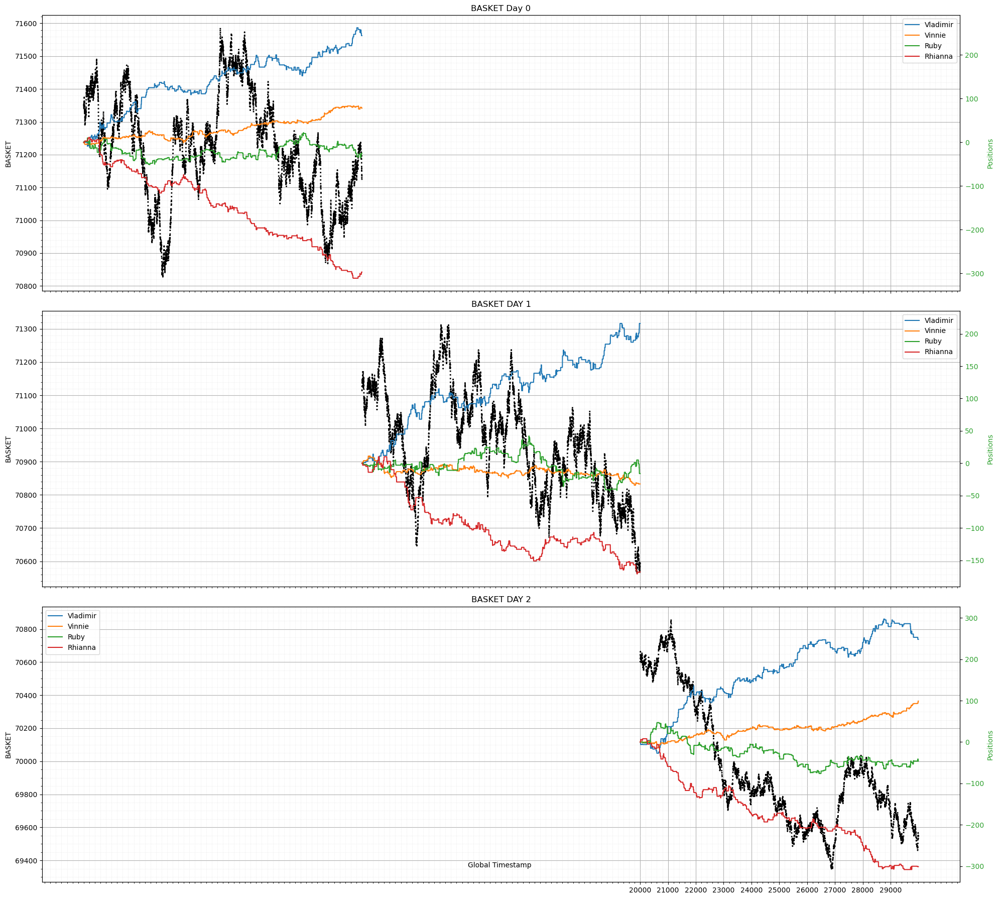

In [132]:
potential_traders = ['Vladimir', 'Vinnie', 'Ruby', 'Rhianna']

fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['BASKET Day 0', 'BASKET DAY 1', 'BASKET DAY 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('BASKET', color=color)
    ax1.plot(range(start, end), df_gift_basket.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Positions', color=color)
    for trader_name in potential_traders:
        ax2.plot(range(start, end),snake_positions[trader_name]['GIFT_BASKET'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

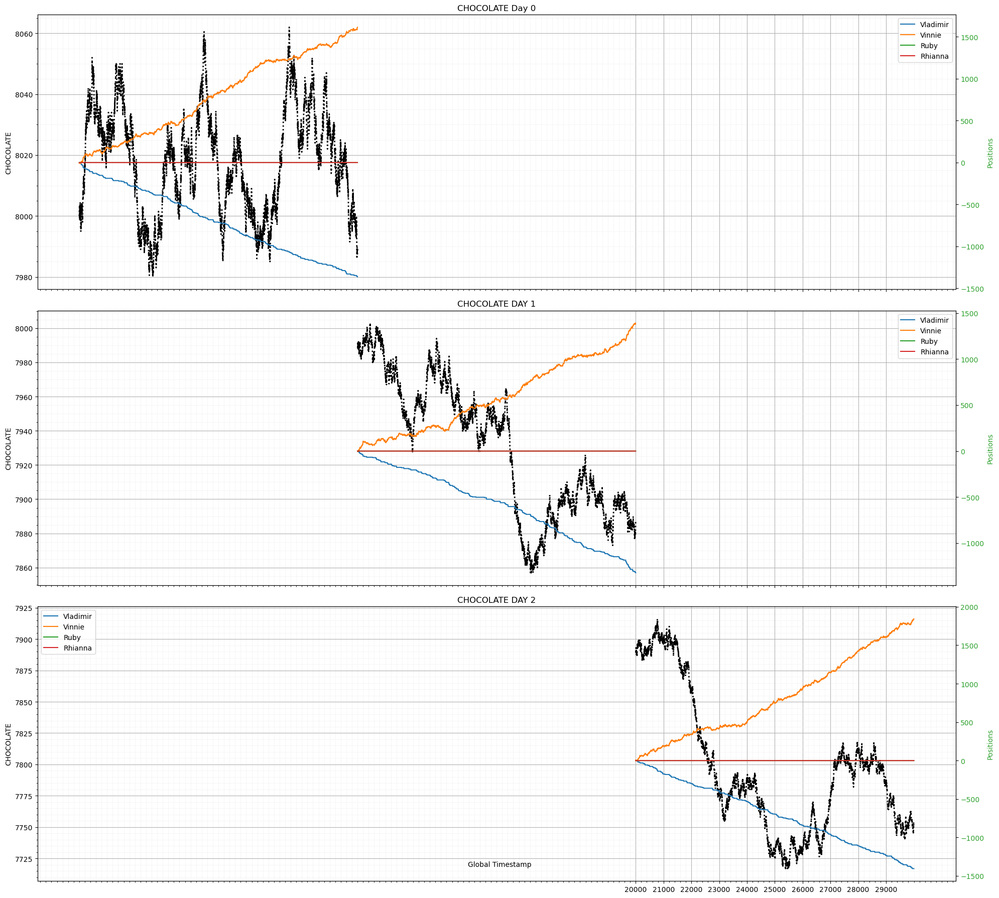

In [133]:
potential_traders = ['Vladimir', 'Vinnie', 'Ruby', 'Rhianna']

fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['CHOCOLATE Day 0', 'CHOCOLATE DAY 1', 'CHOCOLATE DAY 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('CHOCOLATE', color=color)
    ax1.plot(range(start, end), df_chocolate.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Positions', color=color)
    for trader_name in potential_traders:
        ax2.plot(range(start, end),snake_positions[trader_name]['CHOCOLATE'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

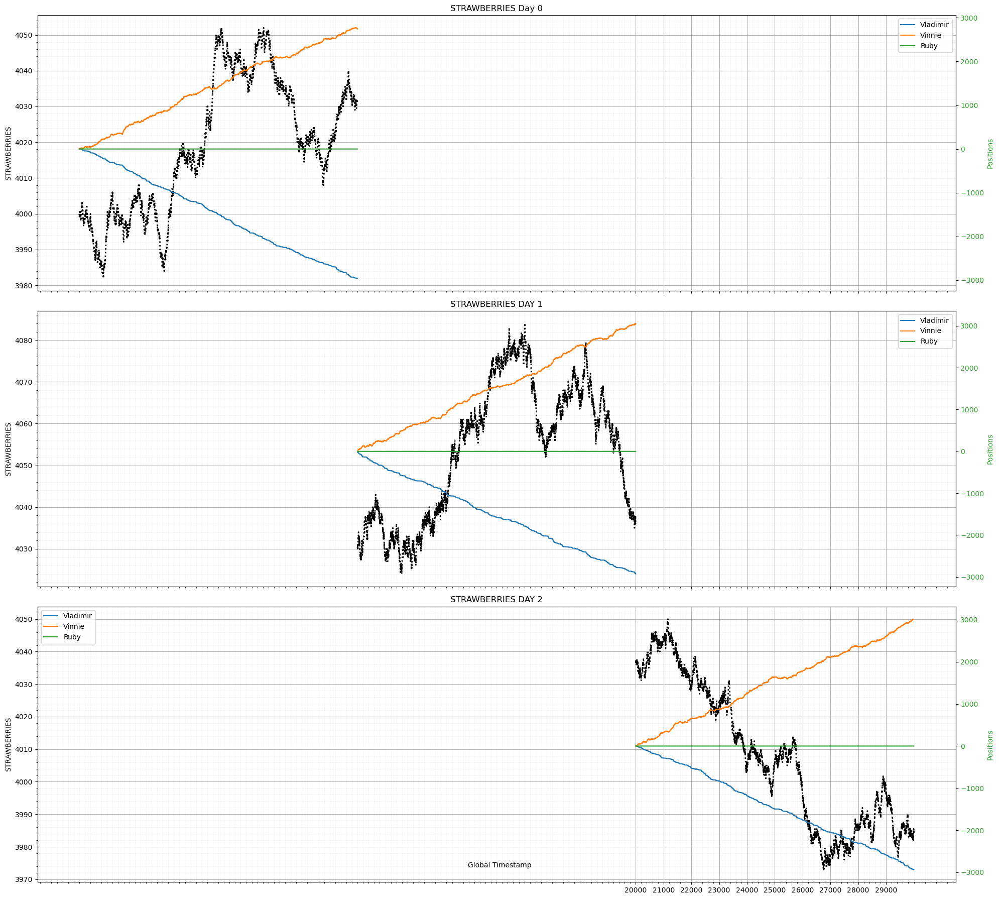

In [25]:
potential_traders = ['Vladimir', 'Vinnie', 'Ruby']

fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['STRAWBERRIES Day 0', 'STRAWBERRIES DAY 1', 'STRAWBERRIES DAY 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('STRAWBERRIES', color=color)
    ax1.plot(range(start, end), df_strawberries.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Positions', color=color)
    for trader_name in potential_traders:
        ax2.plot(range(start, end),snake_positions[trader_name]['STRAWBERRIES'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

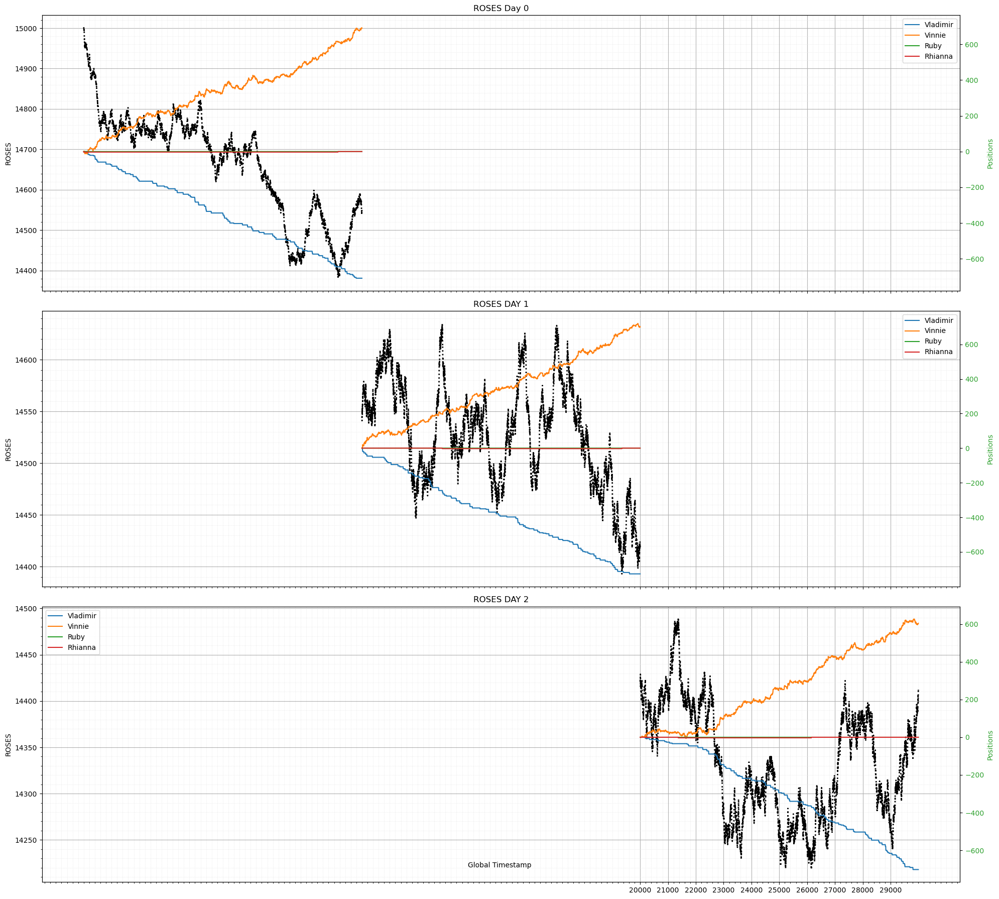

In [134]:
potential_traders = ['Vladimir', 'Vinnie', 'Ruby', 'Rhianna']

fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['ROSES Day 0', 'ROSES DAY 1', 'ROSES DAY 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('ROSES', color=color)
    ax1.plot(range(start, end), df_roses.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Positions', color=color)
    for trader_name in potential_traders:
        ax2.plot(range(start, end),snake_positions[trader_name]['ROSES'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

## Coconut and Coconut Coupon

In [41]:
df_1 = pd.read_csv('training/prices_round_4_day_1.csv' , sep = ';')
df_2 = pd.read_csv('training/prices_round_4_day_2.csv', sep = ';')
df_3 = pd.read_csv('training/prices_round_4_day_2.csv', sep = ';')
df_1['global_timestamp'] = df_1.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
df_2['global_timestamp'] = df_2.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
df_3['global_timestamp'] = df_3.apply(lambda x: x['day'] * 1000000 + x['timestamp'], axis = 1)
df = pd.concat([df_1, df_2, df_3])
df = df.drop(['profit_and_loss'], axis = 1)
df.tail()

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,ask_volume_1,ask_price_2,ask_volume_2,ask_price_3,ask_volume_3,mid_price,global_timestamp
19995,2,999700,COCONUT,9986.0,143.0,9985.0,51.0,NaN,NaN,9987,143,9988.0,51.0,NaN,NaN,9986.5,2999700
19996,2,999800,COCONUT_COUPON,620.0,44.0,NaN,NaN,NaN,NaN,621,44,NaN,NaN,NaN,NaN,620.5,2999800
19997,2,999800,COCONUT,9989.0,119.0,9988.0,57.0,NaN,NaN,9990,119,9991.0,57.0,NaN,NaN,9989.5,2999800
19998,2,999900,COCONUT,9989.0,212.0,NaN,NaN,NaN,NaN,9991,137,9992.0,75.0,NaN,NaN,9990.0,2999900
19999,2,999900,COCONUT_COUPON,620.0,40.0,NaN,NaN,NaN,NaN,621,40,NaN,NaN,NaN,NaN,620.5,2999900


In [42]:
df_coconut = df[df['product'] == 'COCONUT'].reset_index(drop = True)
df_coconut['best_mean'] = df_coconut.apply(calculate_mean_best, axis = 1)
df_coconut_coupon = df[df['product'] == 'COCONUT_COUPON'].reset_index(drop = True)
df_coconut_coupon['best_mean'] = df_coconut_coupon.apply(calculate_mean_best, axis = 1)

In [43]:
round = 4
filename = other_trader_path + f"round_{round}_day_1_profit_balance_snakes.json"
with open(filename, 'r') as file:
    profit_balance_snakes_1 = json.load(file)
file.close()
filename = other_trader_path + f"round_{round}_day_2_profit_balance_snakes.json"
with open(filename, 'r') as file:
    profit_balance_snakes_2 = json.load(file)
filename = other_trader_path + f"round_{round}_day_3_profit_balance_snakes.json"
with open(filename, 'r') as file:
    profit_balance_snakes_3 = json.load(file)
file.close()

profit_balance_snakes_dicts = [profit_balance_snakes_1, profit_balance_snakes_2, profit_balance_snakes_3]
profit_balance_snakes = reformat_json_data_dict(profit_balance_snakes_dicts)

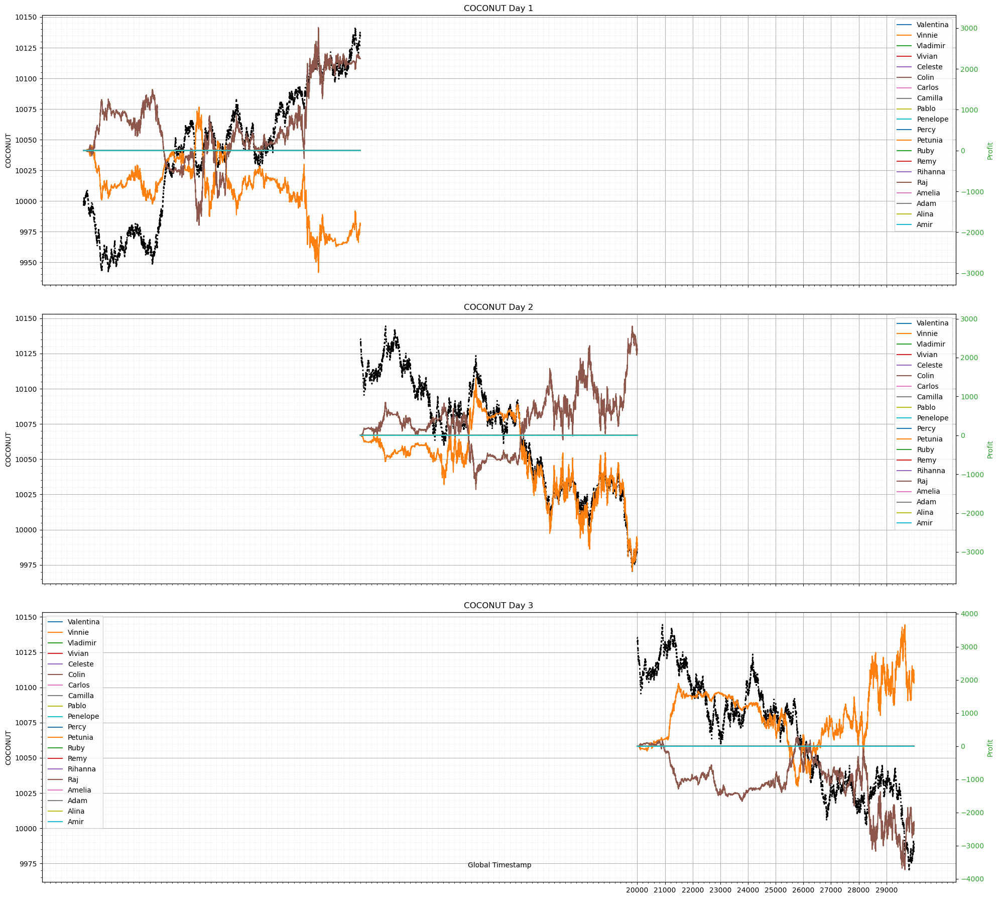

In [44]:
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['COCONUT Day 1', 'COCONUT Day 2', 'COCONUT Day 3']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('COCONUT', color=color)
    ax1.plot(range(start, end), df_coconut.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Profit', color=color)
    for trader_name in profit_balance_snakes:
        ax2.plot(range(start, end),profit_balance_snakes[trader_name]['COCONUT'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

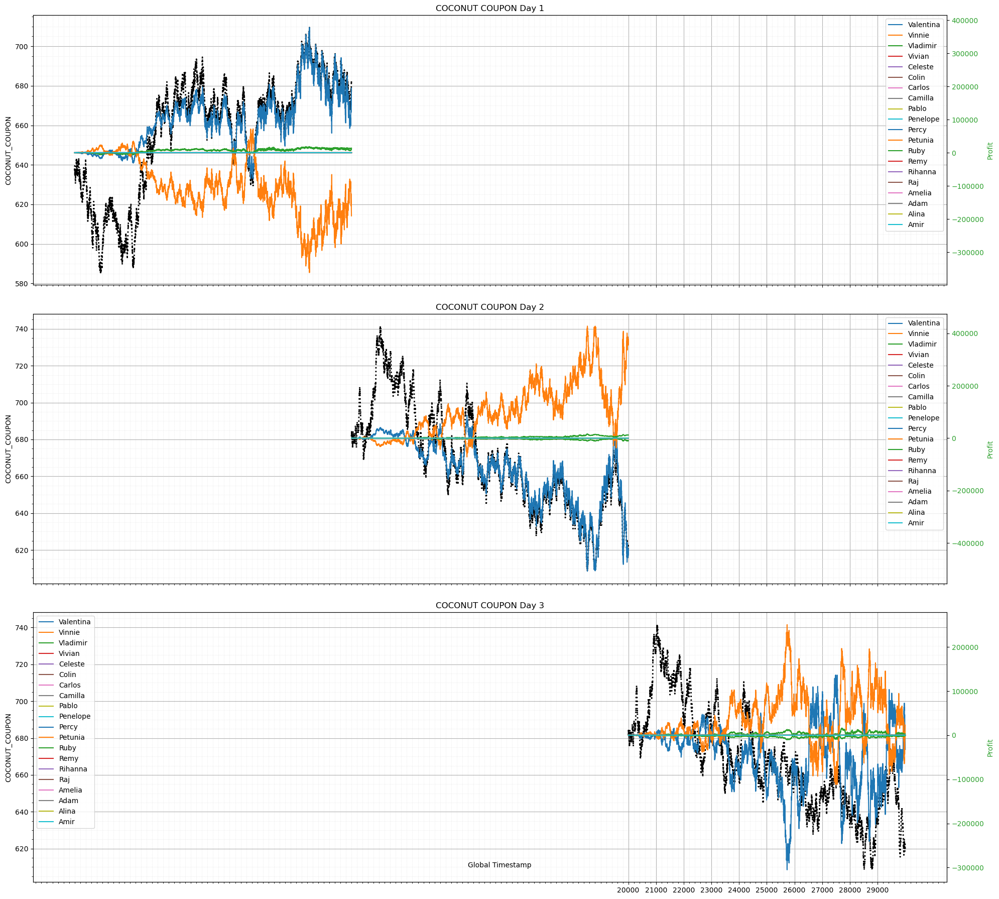

In [47]:
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['COCONUT COUPON Day 1', 'COCONUT COUPON Day 2', 'COCONUT COUPON Day 3']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('COCONUT_COUPON', color=color)
    ax1.plot(range(start, end), df_coconut_coupon.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Profit', color=color)
    for trader_name in profit_balance_snakes:
        ax2.plot(range(start, end),profit_balance_snakes[trader_name]['COCONUT_COUPON'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

In [48]:
filename = other_trader_path + f"round_{round}_day_1_snake_positions_by_timestamp.json"
with open(filename, 'r') as file:
    snake_positions_by_timestamp_1 = json.load(file)
file.close()
filename = other_trader_path + f"round_{round}_day_2_snake_positions_by_timestamp.json"
with open(filename, 'r') as file:
    snake_positions_by_timestamp_2 = json.load(file)
filename = other_trader_path + f"round_{round}_day_3_snake_positions_by_timestamp.json"
with open(filename, 'r') as file:
    snake_positions_by_timestamp_3 = json.load(file)
file.close()

snake_positions_dicts = [snake_positions_by_timestamp_1, snake_positions_by_timestamp_2, snake_positions_by_timestamp_3]
snake_positions = reformat_json_data_dict(snake_positions_dicts)

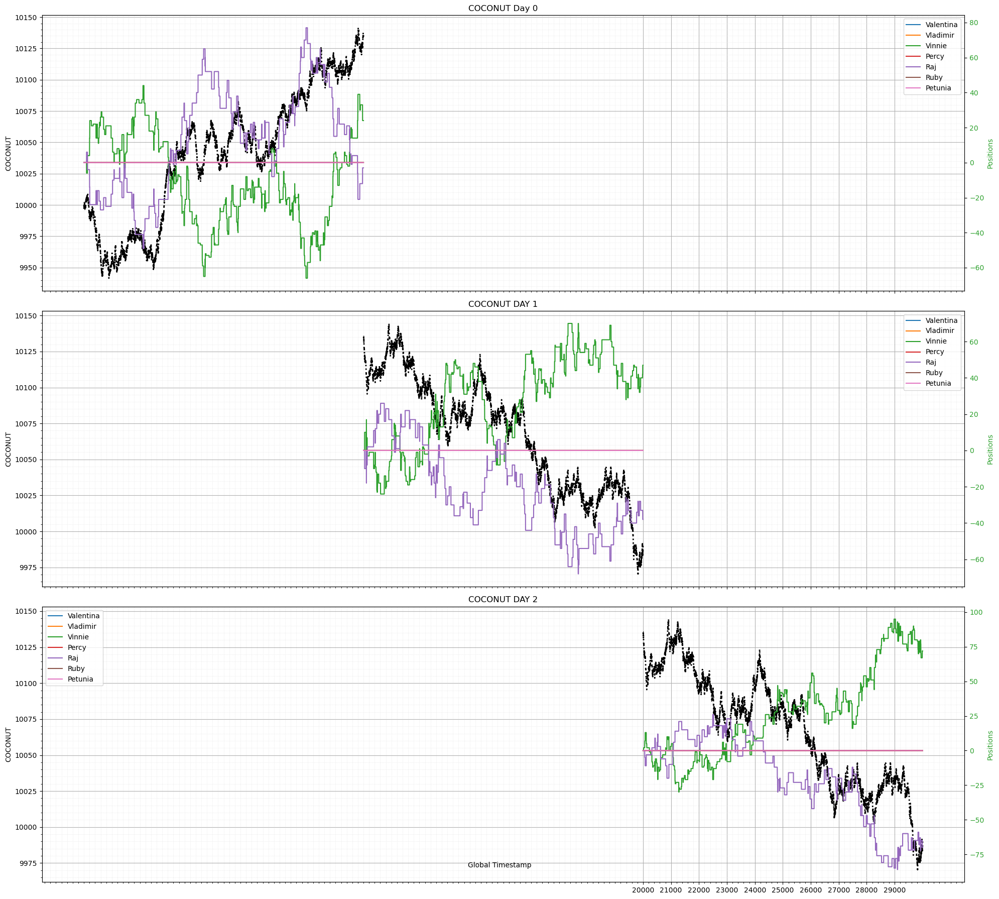

In [76]:
potential_traders = ['Valentina','Vladimir', 'Vinnie', 'Percy', 'Raj', 'Ruby', 'Petunia']

fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['COCONUT Day 0', 'COCONUT DAY 1', 'COCONUT DAY 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('COCONUT', color=color)
    ax1.plot(range(start, end), df_coconut.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Positions', color=color)
    for trader_name in potential_traders:
        ax2.plot(range(start, end),snake_positions[trader_name]['COCONUT'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

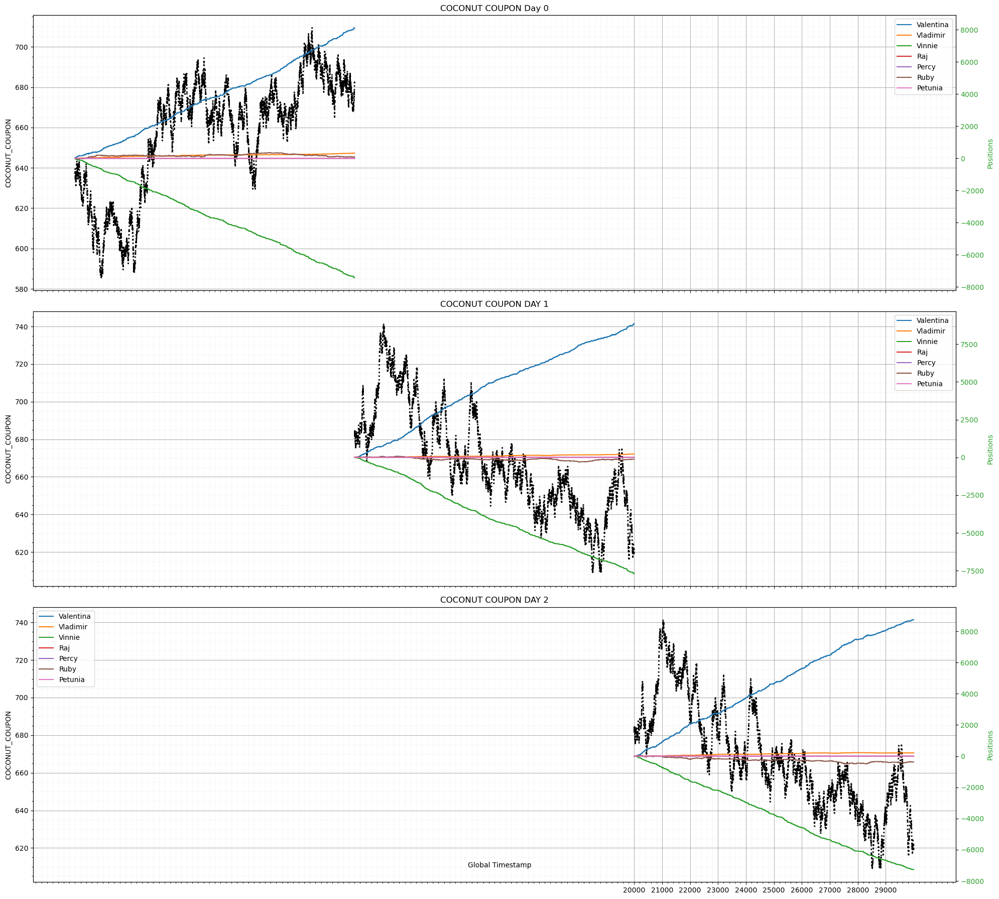

In [77]:
potential_traders = ['Valentina','Vladimir', 'Vinnie','Raj', 'Percy', 'Ruby', 'Petunia']

fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)  # Three subplots on one column, sharing the x-axis

# Define a color palette for the traders

titles = ['COCONUT COUPON Day 0', 'COCONUT COUPON DAY 1', 'COCONUT COUPON DAY 2']
time_intervals = [(0, 10000), (10000, 20000), (20000, 30000)]  # Define your intervals here

for i, ax1 in enumerate(axes):
    start, end = time_intervals[i]

    color = 'k'
    ax1.set_ylabel('COCONUT_COUPON', color=color)
    ax1.plot(range(start, end), df_coconut_coupon.loc[start:end-1,'best_mean'], color=color, linestyle='dotted', linewidth = 2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:green'
    ax2.set_ylabel('Positions', color=color)
    for trader_name in potential_traders:
        ax2.plot(range(start, end),snake_positions[trader_name]['COCONUT_COUPON'][start:end], label = trader_name)
    ax2.tick_params(axis='y', labelcolor=color)

    # Grid and ticks setup
    major_ticks = np.arange(start, end, 1000)
    minor_ticks = np.arange(start, end, 500)
    ax1.set_xticks(major_ticks)
    ax1.set_xticks(minor_ticks, minor=True)
    ax1.grid(True, which='major')
    ax1.grid(True, which='minor', color='#DDDDDD', linestyle=':', linewidth=0.5)
    ax1.minorticks_on()

    # Title for each subplot
    ax2.legend()
    ax1.set_title(titles[i])

# Set common x-label
fig.text(0.5, 0.04, 'Global Timestamp', ha='center', va='center')
fig.tight_layout()  # Adjust layout to make room for all subplots

plt.show()

In [79]:
potential_traders = ['Raj']
for trader_name in potential_traders:
        print('COCONUT', trader_name)
        print(np.corrcoef(df_coconut.loc[0:9999, 'best_mean'], snake_positions[trader_name]['COCONUT'][0:10000])[0][1],
              np.corrcoef(df_coconut.loc[10000:19999, 'best_mean'], snake_positions[trader_name]['COCONUT'][10000:20000])[0][1],
              np.corrcoef(df_coconut.loc[20000:29999, 'best_mean'], snake_positions[trader_name]['COCONUT'][20000:30000])[0][1])

'''
for trader_name in potential_traders:
        print('COCONUT_COUPON', trader_name)
        print(np.corrcoef(df_coconut_coupon.loc[0:9999, 'best_mean'], snake_positions[trader_name]['COCONUT_COUPON'][0:10000])[0][1],
                np.corrcoef(df_coconut_coupon.loc[10000:19999, 'best_mean'], snake_positions[trader_name]['COCONUT_COUPON'][10000:20000])[0][1],
                np.corrcoef(df_coconut_coupon.loc[20000:29999, 'best_mean'], snake_positions[trader_name]['COCONUT_COUPON'][20000:30000])[0][1])
'''

COCONUT Raj
0.6951847536233139 0.781893185223396 0.7683610281968424


"\nfor trader_name in potential_traders:\n        print('COCONUT_COUPON', trader_name)\n        print(np.corrcoef(df_coconut_coupon.loc[0:9999, 'best_mean'], snake_positions[trader_name]['COCONUT_COUPON'][0:10000])[0][1],\n                np.corrcoef(df_coconut_coupon.loc[10000:19999, 'best_mean'], snake_positions[trader_name]['COCONUT_COUPON'][10000:20000])[0][1],\n                np.corrcoef(df_coconut_coupon.loc[20000:29999, 'best_mean'], snake_positions[trader_name]['COCONUT_COUPON'][20000:30000])[0][1])\n"

In [109]:
Raj_coconut_positions = pd.Series(snake_positions['Raj']['COCONUT'])
Raj_coconut_trades = Raj_coconut_positions.diff().fillna(0)
Raj_coconut_df = pd.DataFrame({
    'price': df_coconut.loc[:, 'best_mean'],
    'raj_trades': Raj_coconut_trades
})
for lag in [20, 40, 60, 100]:
    Raj_coconut_df[f'price_in_{lag}'] = Raj_coconut_df['price'].shift(-lag)

Raj_coconut_df['raj_trade_signal'] = Raj_coconut_df.apply(lambda x: 1 if x['raj_trades'] > 0 else (-1 if x['raj_trades'] < 0 else 0),  
                                                          axis = 1)
Raj_coconut_df.dropna(inplace= True)
correlation_matrix = Raj_coconut_df.corr()
print(correlation_matrix)

                     price  raj_trades  price_in_20  price_in_40  price_in_60  \
price             1.000000    0.000149     0.991693     0.984235     0.977042   
raj_trades        0.000149    1.000000    -0.000512     0.000272     0.000743   
price_in_20       0.991693   -0.000512     1.000000     0.991702     0.984245   
price_in_40       0.984235    0.000272     0.991702     1.000000     0.991708   
price_in_60       0.977042    0.000743     0.984245     0.991708     1.000000   
price_in_100      0.962428   -0.000035     0.969669     0.977058     0.984259   
raj_trade_signal  0.000210    0.960405    -0.000769     0.000332     0.001060   

                  price_in_100  raj_trade_signal  
price                 0.962428          0.000210  
raj_trades           -0.000035          0.960405  
price_in_20           0.969669         -0.000769  
price_in_40           0.977058          0.000332  
price_in_60           0.984259          0.001060  
price_in_100          1.000000          0.000

In [113]:
for lag in [20, 40, 60, 100]:
    print(f"lag {lag}")
    model = LinearRegression()
    model.fit(Raj_coconut_df.loc[:9999-lag, ['raj_trades']], Raj_coconut_df.loc[:9999-lag, f'price_in_{lag}'])
    print(model.coef_, model.intercept_)

    model = LinearRegression()
    model.fit(Raj_coconut_df.loc[10000:19999-lag, ['raj_trades']], Raj_coconut_df.loc[10000:19999-lag, f'price_in_{lag}'])
    print(model.coef_, model.intercept_)

    model = LinearRegression()
    model.fit(Raj_coconut_df.loc[20000:, ['raj_trades']], Raj_coconut_df.loc[20000:, f'price_in_{lag}'])
    print(model.coef_, model.intercept_)


    model = LinearRegression()
    model.fit(Raj_coconut_df.loc[:, ['raj_trades']], Raj_coconut_df.loc[:, f'price_in_{lag}'])
    print(model.coef_, model.intercept_)

lag 20
[-0.34308837] 10040.713524121731
[0.03761296] 10067.228419678222
[0.35788262] 10067.90368152177
[-0.02449013] 10058.689714285012
lag 40
[-0.3851068] 10040.796825172534
[0.06408727] 10067.11128741146
[0.39262429] 10067.607001576487
[0.01301474] 10058.676181268518
lag 60
[-0.37679893] 10040.882945514375
[0.11898818] 10067.004634773166
[0.39975206] 10067.327625636524
[0.03560198] 10058.665459629581
lag 100
[-0.36673014] 10041.034201943266
[0.13836933] 10066.808278710436
[0.29712905] 10066.80867961882
[-0.00167642] 10058.64367539752


In [115]:
for lag in [20, 40, 60, 100]:
    print(f"lag {lag}")
    model = LinearRegression()
    model.fit(Raj_coconut_df.loc[0:9999-lag, ['raj_trade_signal']], Raj_coconut_df.loc[10000:19999-lag, f'price_in_{lag}'])
    print(model.coef_, model.intercept_)


    model = LinearRegression()
    model.fit(Raj_coconut_df.loc[10000:19999-lag, ['raj_trade_signal']], Raj_coconut_df.loc[10000:19999-lag, f'price_in_{lag}'])
    print(model.coef_, model.intercept_)

    model = LinearRegression()
    model.fit(Raj_coconut_df.loc[20000:, ['raj_trade_signal']], Raj_coconut_df.loc[20000:, f'price_in_{lag}'])
    print(model.coef_, model.intercept_)


lag 20
[0.92560882] 10067.228121120477
[1.70486111] 10067.228306613226
[0.92085904] 10067.90361492236
lag 40
[1.96332747] 10067.110897256278
[1.99652778] 10067.11109437751
[1.45775586] 10067.607335333612
lag 60
[1.50650899] 10067.004124093663
[2.42708333] 10067.004275653924
[1.7744585] 10067.32822930571
lag 100
[1.88360955] 10066.807739029338
[2.32651962] 10066.807694290947
[1.18916865] 10066.809010355339
